This notebook basically generate all the plots. Some of them have been saved to disk and then imported in the manuscript. Others have been copied and pasted to Inkscape for figure arrangement.

In [1]:
import numpy as np
import pandas as pd
from os.path import join as opj
from glob import glob
import re
import matplotlib.pylab as plt
import seaborn as sns
import os

from scipy.stats import zscore, pearsonr

from nilearn.masking import unmask, apply_mask
from nilearn.image import resample_to_img, new_img_like
from nilearn.input_data import NiftiMasker
from sklearn.preprocessing import maxabs_scale
from sklearn.metrics import r2_score

from nilearn import plotting
from nilearn.plotting import cm
from nilearn.image import math_img
from nilearn import surface
from nilearn import datasets

from matplotlib import gridspec

import sys
sys.path.append("..")

from src.metrics import *
from src.utils import get_results, generate_res_df, get_results_R2
from src.visualization import plot_surf_subcortical

mask_img = "../data/resliced_grey25grey25.nii"

/home/javi/anaconda3/lib/python3.11/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


# DATA DESCRIPTION

In [2]:
nifti_masker = NiftiMasker(mask_img=mask_img)

X_pip_stroop = nifti_masker.fit_transform(sorted(glob(f"../data/PIP/First_Level/*/Stroop/smoothed_con_0003.nii")))
X_pip_msit = nifti_masker.fit_transform(sorted(glob(f"../data/PIP/First_Level/*/MSIT/smoothed_con_0003.nii")))

X_noah_stroop = nifti_masker.fit_transform(sorted(glob(f"../data/NOAH/First_Level/*/Stroop/smoothed_con_0003.nii")))
X_noah_msit = nifti_masker.fit_transform(sorted(glob(f"../data/NOAH/First_Level/*/Stroop/smoothed_con_0003.nii")))

/home/javi/anaconda3/lib/python3.11/site-packages/nilearn/maskers/nifti_masker.py:108: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(
/home/javi/anaconda3/lib/python3.11/site-packages/nilearn/maskers/nifti_masker.py:108: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(
/home/javi/anaconda3/lib/python3.11/site-packages/nilearn/maskers/nifti_masker.py:108: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask 

In [3]:
X_pip = np.mean([X_pip_stroop, X_pip_msit], axis=0)
X_noah = np.mean([X_noah_stroop, X_noah_msit], axis=0)
X = np.vstack((X_pip, X_noah))
study = np.array([0]*X_pip.shape[0] + [1]*X_noah.shape[0])

In [4]:
from pycombat import Combat
pycombat = Combat()
X_combat = pycombat.fit_transform(X, study)
X_pip_combat =  X_combat[study==0]
X_noah_combat =  X_combat[study==1]

/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before o

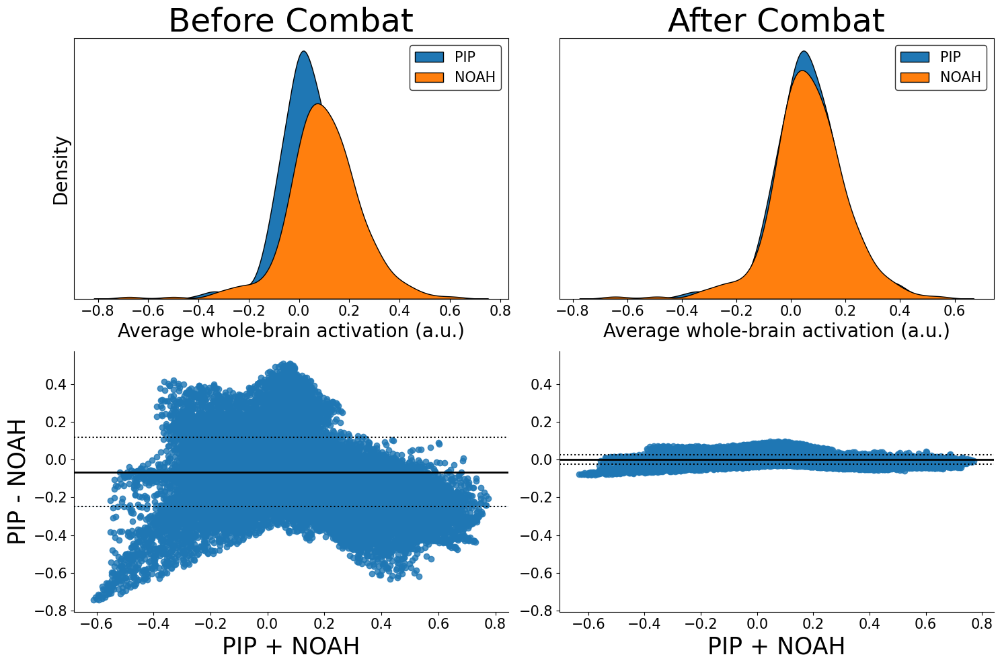

In [5]:
from pingouin import plot_blandaltman
fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(15,10))

sns.kdeplot(X_pip.mean(1), fill=True, label="PIP", ax=axs[0,0], zorder=1, 
            edgecolor='k', alpha=1)
sns.kdeplot(X_noah.mean(1), fill=True, label="NOAH", ax=axs[0,0], zorder=10, edgecolor='k', alpha=1)
axs[0,0].legend(fontsize=15, edgecolor='k')
axs[0,0].set_yticks([])
axs[0,0].set_ylabel("Density", fontsize=20)
axs[0,0].set_xlabel("Average whole-brain activation (a.u.)", fontsize=20)
axs[0,0].set_title("Before Combat", fontsize=35)
axs[0,0].tick_params(labelsize=15)

sns.kdeplot(X_pip_combat.mean(1), fill=True, label="PIP", ax=axs[0,1], edgecolor='k', alpha=1)
sns.kdeplot(X_noah_combat.mean(1), fill=True, label="NOAH", ax=axs[0,1], edgecolor='k', alpha=1)
axs[0,1].legend(fontsize=15, edgecolor='k')
axs[0,1].set_yticks([])
axs[0,1].set_ylabel("")
axs[0,1].set_title("After Combat", fontsize=35)
axs[0,1].set_xlabel("Average whole-brain activation (a.u.)", fontsize=20)
axs[0,1].tick_params(labelsize=15)


plot_blandaltman(X_pip.mean(0), X_noah.mean(0), ax=axs[1, 0], annotate=False)
plot_blandaltman(X_pip_combat.mean(0), X_noah_combat.mean(0), ax=axs[1, 1], annotate=False)
axs[1, 0].set_ylabel("PIP - NOAH", size=25)
axs[1, 0].set_xlabel("PIP + NOAH", size=25)
axs[1, 1].set_ylim(axs[1, 0].get_ylim())
axs[1, 1].set_ylabel("", size=25)
axs[1, 1].set_xlabel("PIP + NOAH", size=25)
axs[1, 0].tick_params(labelsize=15)
axs[1, 1].tick_params(labelsize=15)
plt.tight_layout()
#plt.savefig("../plots/sup_fig_harmonization.svg", dpi=300, facecolor='white')
#plt.savefig("../plots/sup_fig_harmonization.png", dpi=300, facecolor='white')
pass

# PERFORMANCES

In [6]:
# Algorithm: RIDGE
algorithm = "ridge"
res_med_df = []
for m_var in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
    predictions_dir = opj("..", "results",
                          f"Y-mavg_bulbf_ccaf_M-{m_var}_task-both",
                          f"predictions/{algorithm}")

    list_preds_df = []
    cases = glob(opj(predictions_dir, "model*.npz"))
    for case in cases:
        model = re.findall(opj(predictions_dir, 'model_(.*).npz'), case)[0]
        res_file = opj(predictions_dir, f"model_{model}.npz")

        res_pred_df = get_results(res_file)
        res_pred_df['model'] = model
        list_preds_df.append(res_pred_df)

    list_preds_df = pd.concat(list_preds_df)
    res_df = generate_res_df(list_preds_df)[0]
    res_df['mediator'] = m_var
    
    res_med_df.append(res_df)
res_med_df = pd.concat(res_med_df, axis=0)

res_med_df = pd.melt(res_med_df, id_vars=["seed", "mediator", "measure"], var_name=["model"])
res_med_df = res_med_df.replace({'sbp_reactivity_both':r'$\Delta$' + 'SBP', 
                               'sbp_auc_g_both':r'${\rm AUC}_{\rm g}$',
                               'sbp_auc_i_both':r'${\rm AUC}_{\rm i}$'})
res_med_group = res_med_df.groupby(["model", "mediator", "measure"])[["value"]].agg(['mean', 'std', 'sem'])

ci95_hi = []
ci95_lo = []
for i in res_med_group.index:
    m, std, sem = res_med_group.loc[i]
    ci95_hi.append(m + 1.96*sem)
    ci95_lo.append(m - 1.96*sem)

res_med_group[('value', 'ci95_hi')] = ci95_hi
res_med_group[('value', 'ci95_lo')] = ci95_lo


res_med_group.columns = res_med_group.swaplevel(axis=1).columns.droplevel(1)
res_med_group = res_med_group.loc[:, ['mean', 'ci95_lo', 'ci95_hi']]

#res_med_group.columns = pd.MultiIndex.from_frame(res_med_group.columns.to_frame().assign(Performance="Performance").loc[:, ["Performance", 0]])

res_med_group.round(3)


mean  ci95_lo  ci95_hi
model mediator            measure                         
my    $\Delta$SBP         MAE      0.802    0.802    0.803
                          R2       0.009    0.009    0.010
                          r        0.097    0.094    0.101
      ${\rm AUC}_{\rm g}$ MAE      0.744    0.743    0.745
                          R2       0.118    0.118    0.119
                          r        0.344    0.343    0.345
      ${\rm AUC}_{\rm i}$ MAE      0.805    0.804    0.807
                          R2       0.008    0.007    0.009
                          r        0.091    0.088    0.094
xm    $\Delta$SBP         MAE      0.751    0.748    0.754
                          R2       0.036    0.029    0.044
                          r        0.203    0.190    0.216
      ${\rm AUC}_{\rm g}$ MAE      0.799    0.796    0.802
                          R2       0.036    0.028    0.043
                          r        0.195    0.179    0.210
      ${\rm AUC}_{\rm i}$ MAE      0.762    0.759    0.766
                          R2       0.024    0.020    0.028
                          r        0.166    0.158    0.174
xmy   $\Delta$SBP         MAE      0.797    0.796    0.798
                          R2       0.024    0.023    0.026
                          r        0.165    0.161    0.170
      ${\rm AUC}_{\rm g}$ MAE      0.774    0.772    0.776
                          R2       0.071    0.060    0.081
                          r        0.267    0.249    0.285
      ${\rm AUC}_{\rm i}$ MAE      0.796    0.794    0.797
                          R2       0.033    0.025    0.041
                          r        0.184    0.166    0.202
xy    $\Delta$SBP         MAE      0.799    0.797    0.800
                          R2       0.020    0.018    0.021
                          r        0.152    0.147    0.157
      ${\rm AUC}_{\rm g}$ MAE      0.799    0.798    0.800
                          R2       0.025    0.018    0.033
                          r        0.162    0.145    0.180
      ${\rm AUC}_{\rm i}$ MAE      0.797    0.796    0.799
                          R2       0.029    0.021    0.037
                          r        0.173    0.156    0.191

In [7]:
# Algorithm: RIDGE
algorithm = "ridge"
r2_med_df = []
for m_var in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
    predictions_dir = opj("..", "results",
                          f"Y-mavg_bulbf_ccaf_M-{m_var}_task-both",
                          f"predictions/{algorithm}")

    list_preds_df = []
    cases = glob(opj(predictions_dir, "model*.npz"))
    for case in cases:
        model = re.findall(opj(predictions_dir, 'model_(.*).npz'), case)[0]
        res_file = opj(predictions_dir, f"model_{model}.npz")

        res_pred_df = get_results(res_file)
        res_pred_df['model'] = model
        list_preds_df.append(res_pred_df)

    list_preds_df = pd.concat(list_preds_df)
    _, r2_df = generate_res_df(list_preds_df)
    r2_df['mediator'] = m_var
    
    r2_med_df.append(r2_df)

r2_med_df = pd.concat(r2_med_df, axis=0)
r2_med_df = pd.melt(r2_med_df, id_vars=["seed", "mediator"], value_name='R2', var_name="model")
r2_med_df = r2_med_df.replace({'sbp_reactivity_both':r'$\Delta$' + 'SBP', 
                               'sbp_auc_g_both':r'${\rm AUC}_{\rm g}$',
                               'sbp_auc_i_both':r'${\rm AUC}_{\rm i}$'})

#print(r2_med_df.groupby(["model", "mediator"])[['R2']].agg([np.mean, np.std]).round(3))

r2_med_group = r2_med_df.groupby(["model", "mediator"])[['R2']].agg(['mean', 'std', 'sem'])

ci95_hi = []
ci95_lo = []
for i in r2_med_group.index:
    m, std, sem = r2_med_group.loc[i]
    ci95_hi.append(m + 1.96*sem)
    ci95_lo.append(m - 1.96*sem)

r2_med_group['ci95_hi'] = ci95_hi
r2_med_group['ci95_lo'] = ci95_lo

r2_med_group.round(3)

R2               ci95_hi ci95_lo
                            mean    std    sem                
model mediator                                                
med   $\Delta$SBP          0.005  0.001  0.000   0.006   0.004
      ${\rm AUC}_{\rm g}$  0.073  0.004  0.002   0.076   0.070
      ${\rm AUC}_{\rm i}$  0.004  0.000  0.000   0.005   0.004
my    $\Delta$SBP          0.009  0.001  0.000   0.010   0.009
      ${\rm AUC}_{\rm g}$  0.118  0.000  0.000   0.119   0.118
      ${\rm AUC}_{\rm i}$  0.008  0.001  0.000   0.009   0.007
xm    $\Delta$SBP          0.036  0.008  0.004   0.044   0.029
      ${\rm AUC}_{\rm g}$  0.036  0.009  0.004   0.043   0.028
      ${\rm AUC}_{\rm i}$  0.024  0.004  0.002   0.028   0.020
xmy   $\Delta$SBP          0.024  0.002  0.001   0.026   0.023
      ${\rm AUC}_{\rm g}$  0.071  0.012  0.005   0.081   0.060
      ${\rm AUC}_{\rm i}$  0.033  0.010  0.004   0.041   0.025
xy    $\Delta$SBP          0.020  0.002  0.001   0.021   0.018
      ${\rm AUC}_{\rm g}$  0.025  0.008  0.004   0.033   0.018
      ${\rm AUC}_{\rm i}$  0.029  0.009  0.004   0.037   0.021

/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/javi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) inst

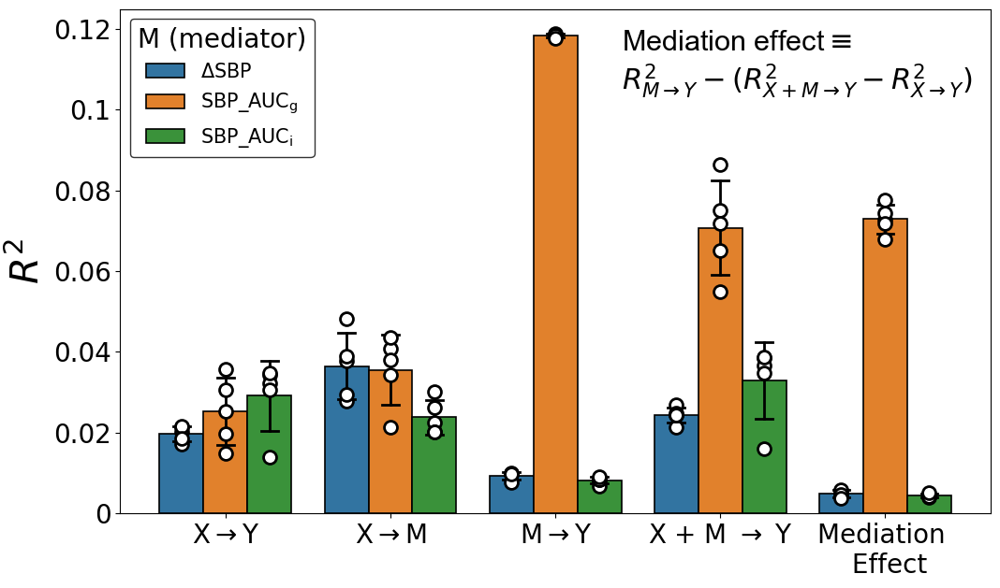

In [8]:
# Algorithm: RIDGE
algorithm = "ridge"
r2_med_df = []
for m_var in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
    predictions_dir = opj("..", "results",
                          f"Y-mavg_bulbf_ccaf_M-{m_var}_task-both",
                          f"predictions/{algorithm}")

    list_preds_df = []
    cases = glob(opj(predictions_dir, "model*.npz"))
    for case in cases:
        model = re.findall(opj(predictions_dir, 'model_(.*).npz'), case)[0]
        res_file = opj(predictions_dir, f"model_{model}.npz")

        res_pred_df = get_results(res_file)
        res_pred_df['model'] = model
        list_preds_df.append(res_pred_df)

    list_preds_df = pd.concat(list_preds_df)
    r2_df = generate_res_df(list_preds_df)[-1]
    r2_df['mediator'] = m_var
    
    r2_med_df.append(r2_df)

r2_med_df = pd.concat(r2_med_df, axis=0)
r2_med_df = pd.melt(r2_med_df, id_vars=["seed", "mediator"], value_name='R2', var_name="model")
r2_med_df = r2_med_df.replace({'sbp_reactivity_both':r'$\Delta$' + 'SBP', 
                               'sbp_auc_g_both': 'SBP_' + r'${\rm AUC}_{\rm g}$',
                               'sbp_auc_i_both': 'SBP_' + r'${\rm AUC}_{\rm i}$'})


fig, ax =  plt.subplots(figsize=(12,7))
sns.barplot(x="model", y="R2", hue="mediator", data=r2_med_df,  edgecolor='k',
            seed=1234, ax=ax,
            errorbar="sd", errcolor="k", errwidth=2, capsize=0.1,
            linewidth=1.2, zorder=1)

#ic_model = {'xy': 0, 'xm': 3, 'my': 6, 'xmy':9, 'med':12} 
ic_mediator = {r'$\Delta$' + 'SBP': 0, 'SBP_' + r'${\rm AUC}_{\rm g}$': 5, 'SBP_' + r'${\rm AUC}_{\rm i}$': 10}

r2_med_grouped_df = r2_med_df.groupby(["model", "mediator"])


for mediator in ic_mediator.keys():
    for ii, model in enumerate(['xy', 'xm', 'my', 'xmy', 'med']):
        ix_path =  ic_mediator[mediator] + ii
        x = ax.patches[ix_path].get_x() + ax.patches[ix_path].get_width()/2
        x = np.array(5*[x]) 
        y = r2_med_grouped_df.get_group((model, mediator))['R2']

        ax.scatter(x=x, y=y, c='white', s=100, zorder=3, edgecolor='k', linewidth=2)
        
ax.set_xlabel("")
ax.set_ylabel(r"$R^2$", size=30)
ax.set_xticklabels([r"X$\rightarrow$Y", 
                    r"X$\rightarrow$M", 
                    r"M$\rightarrow$Y", 
                    r"X + M $\rightarrow$ Y", "Mediation \n Effect"], rotation=0)
ax.set_yticks([0, 0.02, 0.04, 0.06,0.08, 0.1, 0.12])
ax.set_yticklabels(["0", "0.02", "0.04", "0.06","0.08", "0.1", "0.12"])

ax.tick_params(labelsize=20)

ax.legend(fontsize=15, title="M (mediator)", title_fontsize=20, loc=2, edgecolor='k')
#ax.legend()
ax.text(x=2.4, y=0.105, 
        s = 'Mediation effect' + r'$\equiv$' + "\n" + r'$R^2_{M\rightarrow Y} - (R^2_{X+M\rightarrow Y} - R^2_{X\rightarrow Y})$',
        fontfamily="Arial",
        fontsize=22)
pass
#plt.savefig(f"../plots/Fig_performances_boxes_{algorithm}.svg", dpi=300)
#plt.savefig(f"../plots/Fig_performances_boxes_{algorithm}.png", dpi=300)

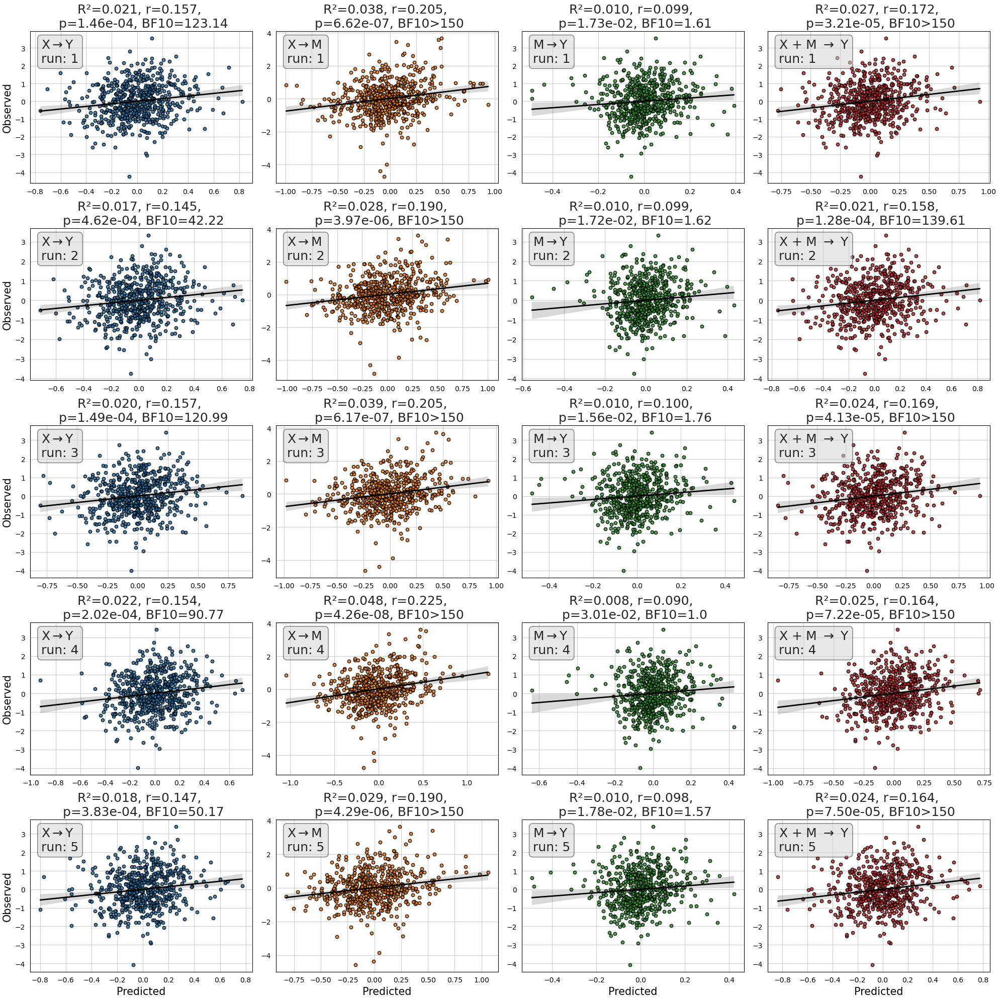

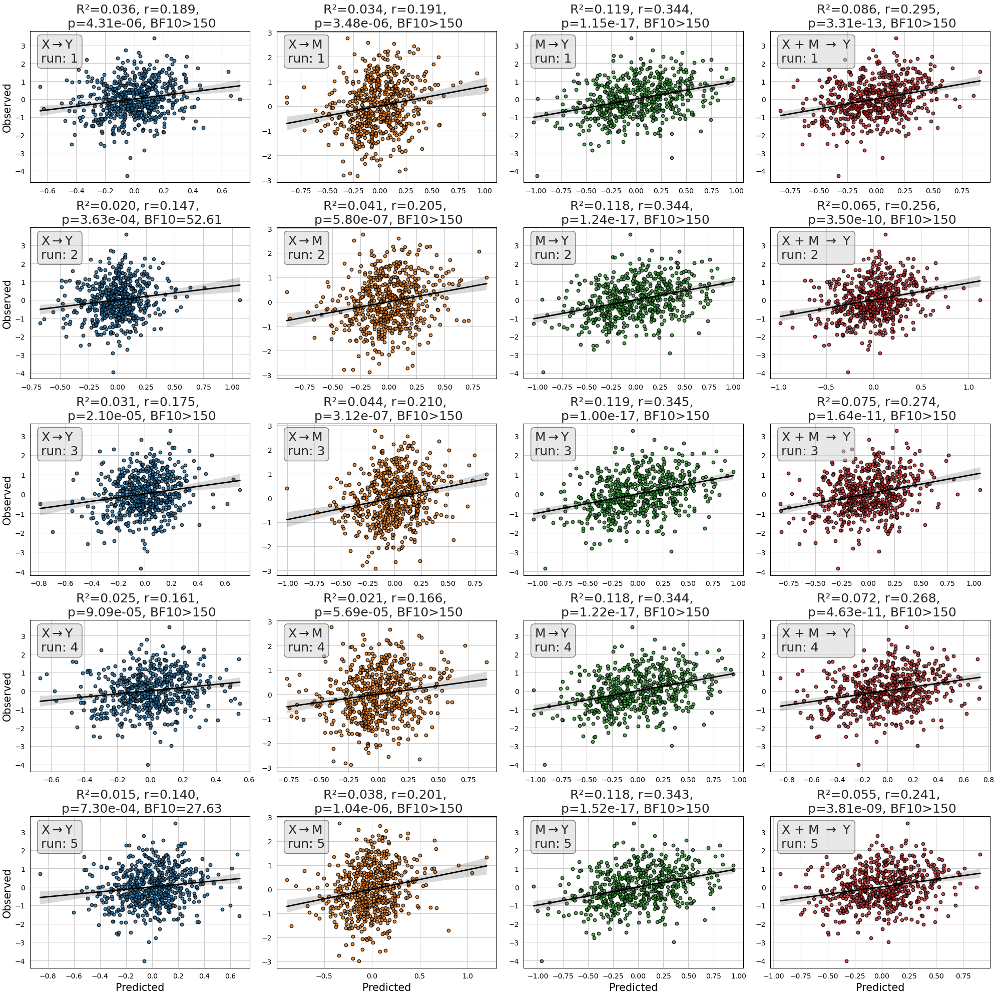

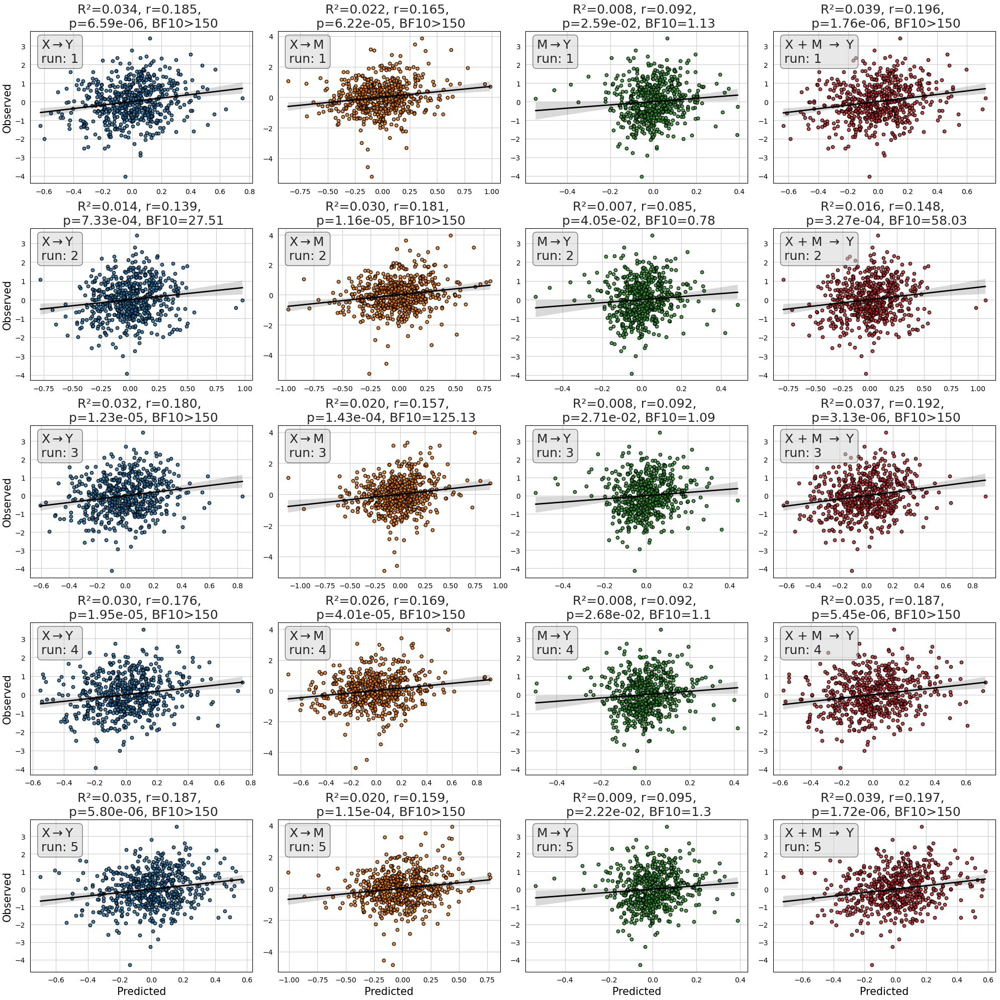

In [9]:
# Scatterplots
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import FloatVector
from scipy.stats import pearsonr
algorithm = "ridge"
with sns.axes_style("whitegrid", {"axes.edgecolor": 'k', 
                                  'axes.labelcolor': 'k',
                                  'xtick.color': 'k',
                                  'ytick.color': 'k', 
                                  'font.family': ['sans-serif'],
                                  'font.sans-serif': ['Arial']}):
    
    for m_var in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
        predictions_dir = opj("..", "results",
                              f"Y-mavg_bulbf_ccaf_M-{m_var}_task-both",
                              f"predictions/{algorithm}")

        list_preds_df = []
        cases = glob(opj(predictions_dir, "model*.npz"))
        for case in cases:
            model = re.findall(opj(predictions_dir, 'model_(.*).npz'), case)[0]
            res_file = opj(predictions_dir, f"model_{model}.npz")

            res_pred_df = get_results(res_file)
            res_pred_df['model'] = model
            list_preds_df.append(res_pred_df)

        list_preds_df = pd.concat(list_preds_df)
    
        fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))

        for jx, model_id in enumerate(["xy", "xm", "my", "xmy"]):
            for ix, repeat_id in enumerate(range(1, 6)):
                cond = (list_preds_df.model == model_id) & (list_preds_df.seed == repeat_id)
                res_df = list_preds_df.loc[cond,:]
                r, p = pearsonr(res_df.true, res_df.pred)
                r2 =  r2_score(res_df.true, res_df.pred)
                bayes_factor = importr("BayesFactor")
                bf = bayes_factor.extractBF(bayes_factor.correlationBF(FloatVector(res_df.true.to_numpy()),
                                                                       FloatVector(res_df.pred.to_numpy())),
                                            onlybf=True)
                if bf[0]>150:
                    bf="BF10>150"
                else:
                    bf = np.round(bf[0], 2)
                    bf=f"BF10={bf}"

                title = f"R²={r2:.3f}, r={r:.3f}, \n p={p:.2e}, {bf}"

                props = dict(boxstyle='round', edgecolor='k', facecolor='white', alpha=1)

                sns.regplot(x='pred', y='true', data=res_df, 
                            scatter_kws={'s':20, 'linewidths':1.2, 'edgecolors':'k',
                                         'color':sns.color_palette()[jx]}, 
                            line_kws={'linewidth':2, 'color':'k'}, 
                            ax=axs[ix, jx])

                axs[ix, jx].set_xlabel("")
                axs[ix, jx].set_ylabel("")
                axs[ix, jx].set_title(title, fontsize=18)

                axs[ix, 0].set_ylabel("Observed", fontsize=15)
                
                if model_id == "xy":
                    text = r"X$\rightarrow$Y"
                elif model_id == "xm":
                    text = r"X$\rightarrow$M"
                elif model_id == "my":
                    text = r"M$\rightarrow$Y"
                else:
                    text = r"X + M $\rightarrow$ Y"
                    
                text = text + "\n" + f"run: {repeat_id}"
                axs[ix, jx].text(0.05, .95, text,  fontsize=18, 
                                 transform = axs[ix, jx].transAxes, ha="left", 
                                 va='top',
                                 bbox=dict(boxstyle='round', edgecolor="k", 
                                           facecolor='lightgrey', alpha=0.5))
            axs[ix, jx].set_xlabel("Predicted", fontsize=15)

        plt.tight_layout()
        #plt.savefig(f"../plots/sup_fig_performances_scatter_{algorithm}_{m_var}.svg", dpi=300)
        #plt.savefig(f"../plots/sup_fig_performances_scatter_{algorithm}_{m_var}.png", dpi=300)
        pass

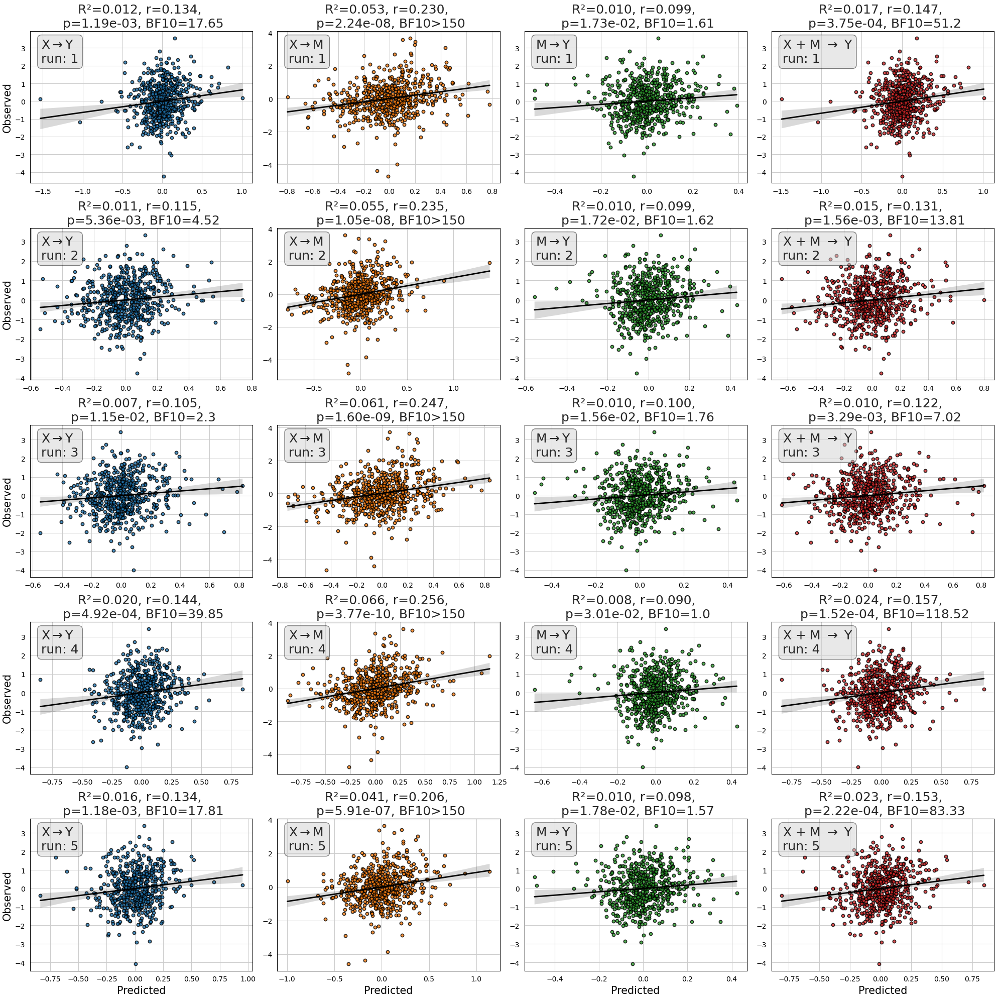

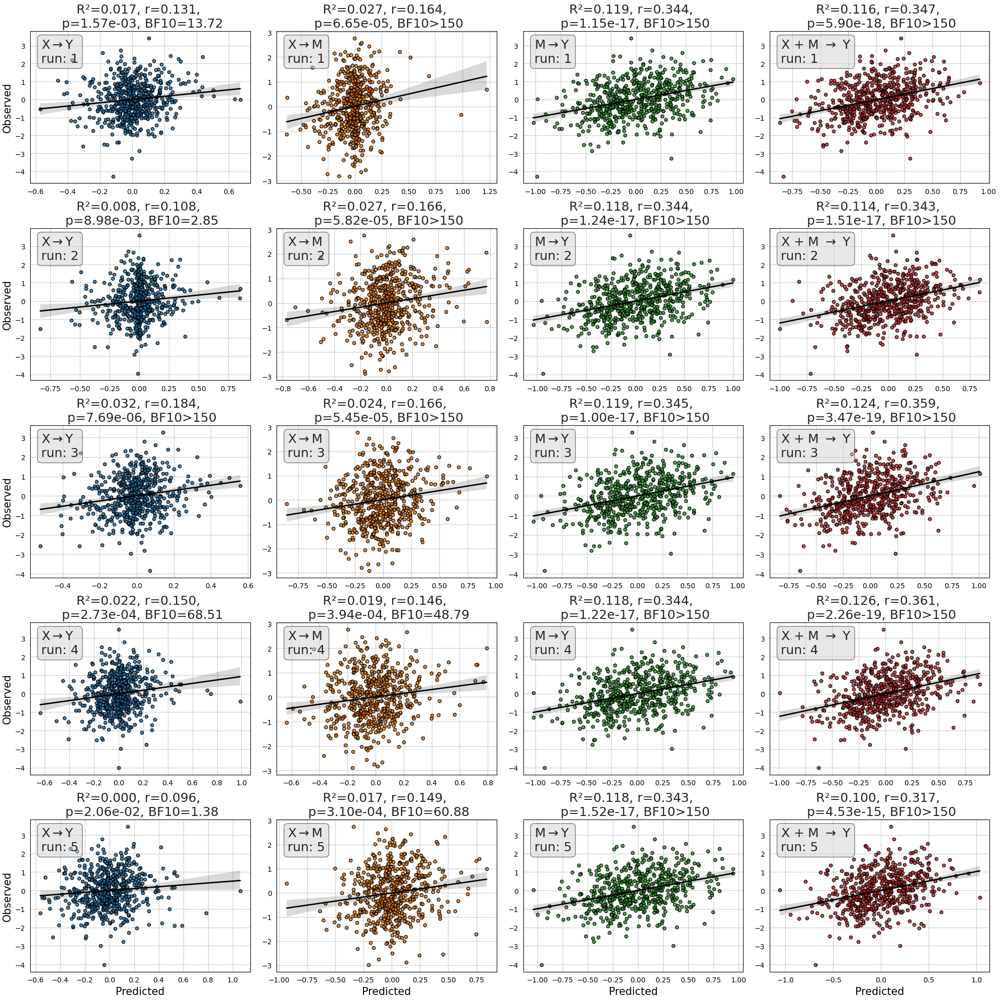

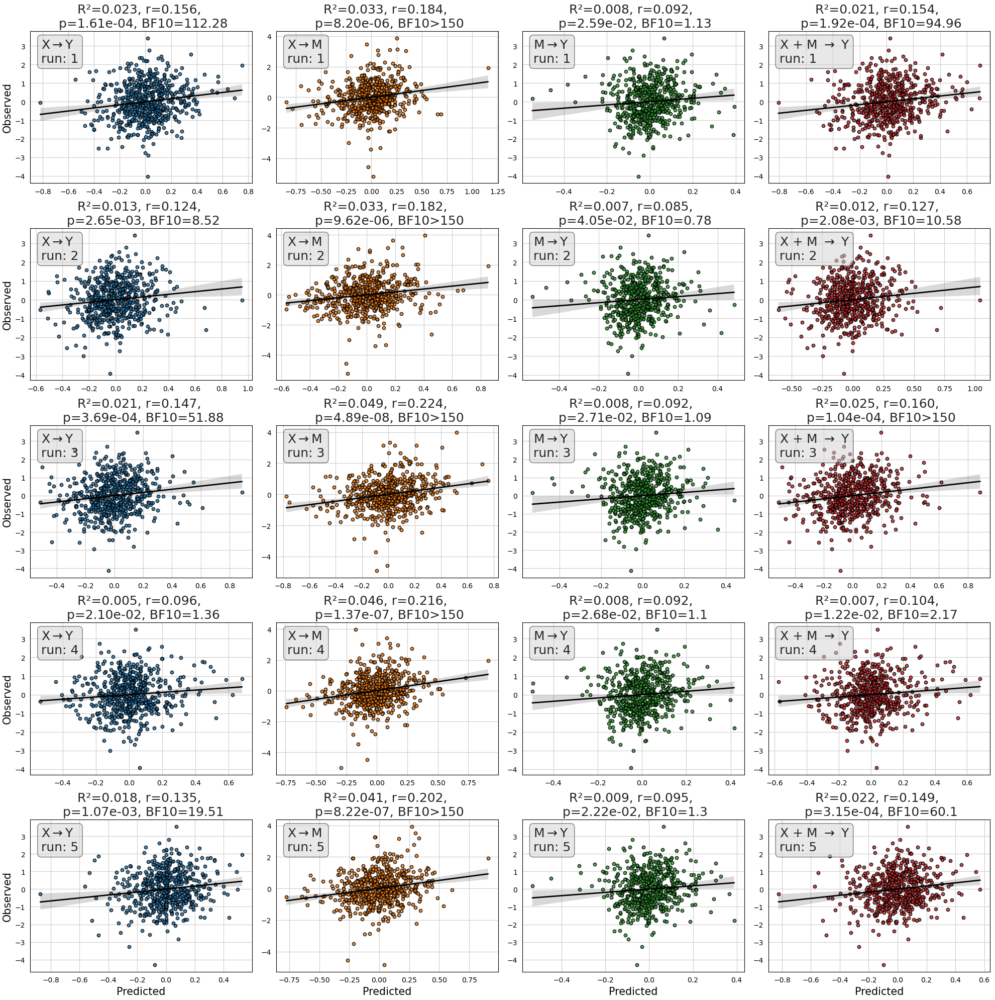

In [10]:
# Scatterplots (LASSO)
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import FloatVector
from scipy.stats import pearsonr
algorithm = "lasso"
with sns.axes_style("whitegrid", {"axes.edgecolor": 'k', 
                                  'axes.labelcolor': 'k',
                                  'xtick.color': 'k',
                                  'ytick.color': 'k', 
                                  'font.family': ['sans-serif'],
                                  'font.sans-serif': ['Arial']}):
    
    for m_var in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
        predictions_dir = opj("..", "results",
                              f"Y-mavg_bulbf_ccaf_M-{m_var}_task-both",
                              f"predictions/{algorithm}")

        list_preds_df = []
        cases = glob(opj(predictions_dir, "model*.npz"))
        for case in cases:
            model = re.findall(opj(predictions_dir, 'model_(.*).npz'), case)[0]
            res_file = opj(predictions_dir, f"model_{model}.npz")

            res_pred_df = get_results(res_file)
            res_pred_df['model'] = model
            list_preds_df.append(res_pred_df)

        list_preds_df = pd.concat(list_preds_df)
    
        fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))

        for jx, model_id in enumerate(["xy", "xm", "my", "xmy"]):
            for ix, repeat_id in enumerate(range(1, 6)):
                cond = (list_preds_df.model == model_id) & (list_preds_df.seed == repeat_id)
                res_df = list_preds_df.loc[cond,:]
                r, p = pearsonr(res_df.true, res_df.pred)
                r2 =  r2_score(res_df.true, res_df.pred)
                bayes_factor = importr("BayesFactor")
                bf = bayes_factor.extractBF(bayes_factor.correlationBF(FloatVector(res_df.true.to_numpy()),
                                                                       FloatVector(res_df.pred.to_numpy())),
                                            onlybf=True)
                if bf[0]>150:
                    bf="BF10>150"
                else:
                    bf = np.round(bf[0], 2)
                    bf=f"BF10={bf}"

                title = f"R²={r2:.3f}, r={r:.3f}, \n p={p:.2e}, {bf}"

                props = dict(boxstyle='round', edgecolor='k', facecolor='white', alpha=1)

                sns.regplot(x='pred', y='true', data=res_df, 
                            scatter_kws={'s':20, 'linewidths':1.2, 'edgecolors':'k',
                                         'color':sns.color_palette()[jx]}, 
                            line_kws={'linewidth':2, 'color':'k'}, 
                            ax=axs[ix, jx])

                axs[ix, jx].set_xlabel("")
                axs[ix, jx].set_ylabel("")
                axs[ix, jx].set_title(title, fontsize=18)

                axs[ix, 0].set_ylabel("Observed", fontsize=15)
                
                if model_id == "xy":
                    text = r"X$\rightarrow$Y"
                elif model_id == "xm":
                    text = r"X$\rightarrow$M"
                elif model_id == "my":
                    text = r"M$\rightarrow$Y"
                else:
                    text = r"X + M $\rightarrow$ Y"
                    
                text = text + "\n" + f"run: {repeat_id}"
                axs[ix, jx].text(0.05, .95, text,  fontsize=18, 
                                 transform = axs[ix, jx].transAxes, ha="left", 
                                 va='top',
                                 bbox=dict(boxstyle='round', edgecolor="k", 
                                           facecolor='lightgrey', alpha=0.5))
                
            axs[ix, jx].set_xlabel("Predicted", fontsize=15)

        plt.tight_layout()
#        plt.savefig(f"../plots/sup_fig_performances_scatter_{algorithm}_{m_var}.svg", dpi=300)
#        plt.savefig(f"../plots/sup_fig_performances_scatter_{algorithm}_{m_var}.png", dpi=300)
        pass

# ENCODING WEIGHTS

Only sbp_auc_g_both, as it is the only one providing a meaningful mediation effect.

In [11]:
# load enconding maps. Only ab gives significant components.

ab_encoding_img = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr.nii.gz"

# Process this image for plotting
if os.path.exists(ab_encoding_img):
    # Scaled map
    ab_encoding_img_scaled = unmask(maxabs_scale(apply_mask(ab_encoding_img, mask_img)), mask_img)
    ab_encoding_img_scaled.to_filename(ab_encoding_img.replace(".nii.gz", "_scaled.nii.gz"))
    # zscore map
    ab_encoding_img_z = unmask(zscore(apply_mask(ab_encoding_img, mask_img)), mask_img)
    ab_encoding_img_z.to_filename(ab_encoding_img.replace(".nii.gz", "_zscore.nii.gz"))
    # filtered zscore map (|z|>1)
    mask = (abs(apply_mask(ab_encoding_img_z, mask_img))>1)
    ab_encoding_img_z_thr = unmask(apply_mask(ab_encoding_img_scaled, mask_img)*mask, mask_img)
    ab_encoding_img_z_thr.to_filename(ab_encoding_img.replace(".nii.gz", "_zscore_z1.nii.gz"))
    
    # filtered zscore map (|z|>1)
    thr70 = np.percentile(abs(apply_mask(ab_encoding_img_scaled, mask_img)), 70)
    mask = (apply_mask(ab_encoding_img_scaled, mask_img) >= thr70) | (apply_mask(ab_encoding_img_scaled, mask_img) <= -thr70)
    ab_encoding_img_scaled_thr = unmask(apply_mask(ab_encoding_img_scaled, mask_img)*mask, mask_img)
    ab_encoding_img_scaled_thr.to_filename(ab_encoding_img.replace(".nii.gz", "_scaled_30.nii.gz"))

In [12]:
# Convert to surface files
input_file = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled.nii.gz"
for hemi in ["L", "R"]:
    ref_surface= f"../data/Q1-Q6_R440.{hemi}.pial.164k_fs_LR.surf.gii"
    outfile = input_file.replace(".nii.gz", f".{hemi}.shape.gii")
    cmd = f"wb_command -volume-to-surface-mapping {input_file} {ref_surface} {outfile} -enclosing"
    os.system(cmd)

input_file = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_zscore.nii.gz"
for hemi in ["L", "R"]:
    ref_surface= f"../data/Q1-Q6_R440.{hemi}.pial.164k_fs_LR.surf.gii"
    outfile = input_file.replace(".nii.gz", f".{hemi}.shape.gii")
    cmd = f"wb_command -volume-to-surface-mapping {input_file} {ref_surface} {outfile} -enclosing"
    os.system(cmd)
    
input_file = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_zscore_z1.nii.gz"
for hemi in ["L", "R"]:
    ref_surface= f"../data/Q1-Q6_R440.{hemi}.pial.164k_fs_LR.surf.gii"
    outfile = input_file.replace(".nii.gz", f".{hemi}.shape.gii")
    cmd = f"wb_command -volume-to-surface-mapping {input_file} {ref_surface} {outfile} -enclosing"
    os.system(cmd)
    
input_file = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.nii.gz"
for hemi in ["L", "R"]:
    ref_surface= f"../data/Q1-Q6_R440.{hemi}.pial.164k_fs_LR.surf.gii"
    outfile = input_file.replace(".nii.gz", f".{hemi}.shape.gii")
    cmd = f"wb_command -volume-to-surface-mapping {input_file} {ref_surface} {outfile} -enclosing"
    os.system(cmd)

### Cortical plots

/tmp/ipykernel_21865/2840849604.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_21865/2840849604.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


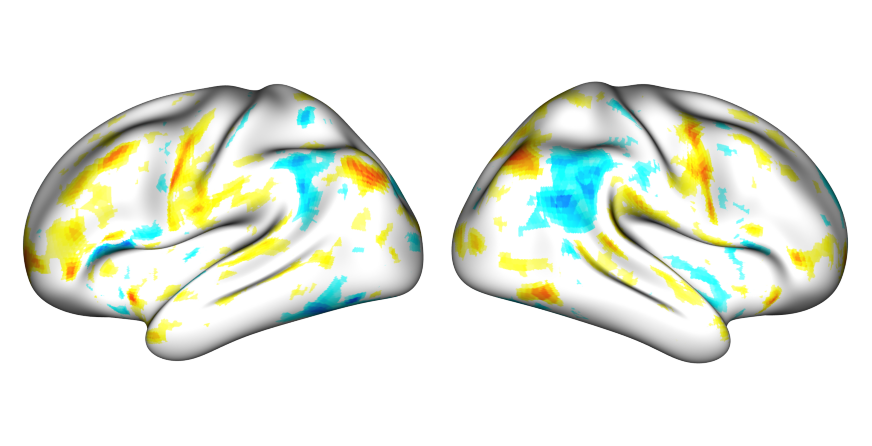

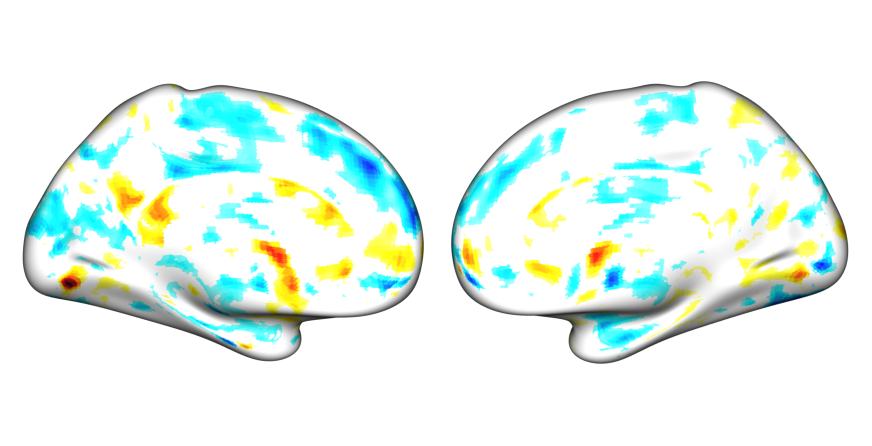

In [13]:
from surfplot import Plot
from surfplot.utils import add_fslr_medial_wall
from neuromaps.datasets import fetch_fslr, fetch_fsaverage
from neuromaps.transforms import mni152_to_fslr, mni152_to_fsaverage

surfaces = fetch_fslr(density='164k')
lh, rh = surfaces['inflated']

lh_mid, rh_mid = surfaces['vaavg']

# shading
lh_sulc, rh_sulc = surfaces['sulc']

enc_lh_thr= "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.L.shape.gii"
enc_rh_thr= "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.R.shape.gii"

vmax = 1#abs(load_img("../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_.nii.gz").get_fdata()).max()
color_range = (-vmax, vmax)

brightness = 1
p = Plot(surf_lh=lh, surf_rh=rh, views=['lateral'], size=(1000, 500), zoom=1.2, 
         brightness=brightness)

#p.add_layer({'left': lh_sulc, 'right': rh_sulc}, cmap='binary_r', cbar=False, alpha=0.5, zero_transparent=True)

p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

p = Plot(surf_lh=lh, surf_rh=rh, views=['medial'], size=(1000, 500), 
         zoom=1.2, brightness=brightness, background=(0,0,0))
#p.add_layer({'left': lh_sulc, 'right': rh_sulc}, cmap='binary_r', cbar=False, alpha=0.5)

#fig = p.build()
p.add_layer({'left': enc_lh_thr,
             'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

In [14]:
# This class inherits from Plot. It is used to manipulation the saturation of the background images
class alphaPlot(Plot):
    
    from surfplot.plotting import _set_layout, _check_surf
    
    def __init__(self, surf_lh=None, surf_rh=None, layout='grid', views=None, 
                     mirror_views=False, flip=False, size=(500, 400), zoom=1.5, 
                     background=(1, 1, 1), label_text=None, brightness=.5, alpha=1):
            hemi_inputs = zip(['left', 'right'], [surf_lh, surf_rh])
            self.surfaces = {k: _check_surf(v) 
                             for k, v in hemi_inputs if v is not None}

            if len(self.surfaces) == 0:
                raise ValueError('No surfaces are provided')

            if views == None:
                views = ['lateral', 'medial']
            self.plot_layout = _set_layout(surf_lh, surf_rh, layout, views, 
                                           mirror_views)
            self.flip = flip

            # plot_surf args
            self.size = size
            self.zoom = zoom
            self.background = background
            self.label_text = label_text

            # these are updated with each overlay
            self.layers, self.cmaps, self.color_ranges = [], [], []
            self._show_cbar, self.cbar_labels = [], []

            # add gray surface default:
            backdrop = np.ones(sum([v.n_points for v in self.surfaces.values()]))
            brightness = 1e-6 if brightness == 0 else brightness
            backdrop *= brightness
            self.add_layer(backdrop, 'Greys_r', alpha=alpha, color_range=(0, 1), cbar=False)


/tmp/ipykernel_21865/3761568621.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_21865/3761568621.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_21865/3761568621.py:36: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/tmp/ipykernel_21865/3761568621.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


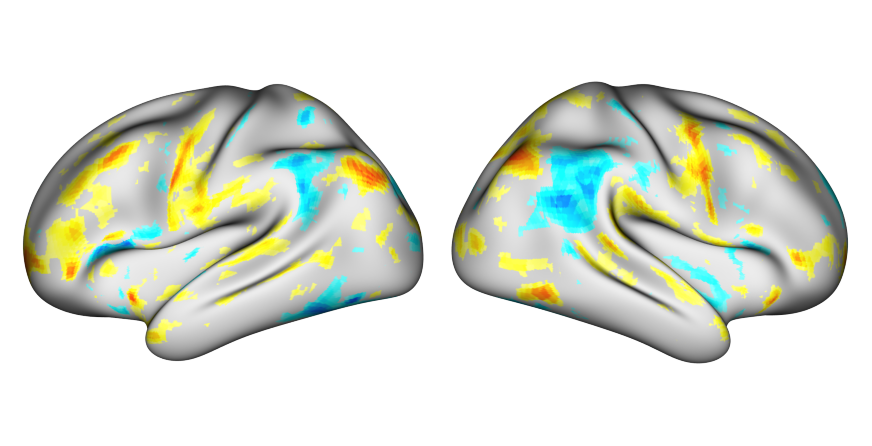

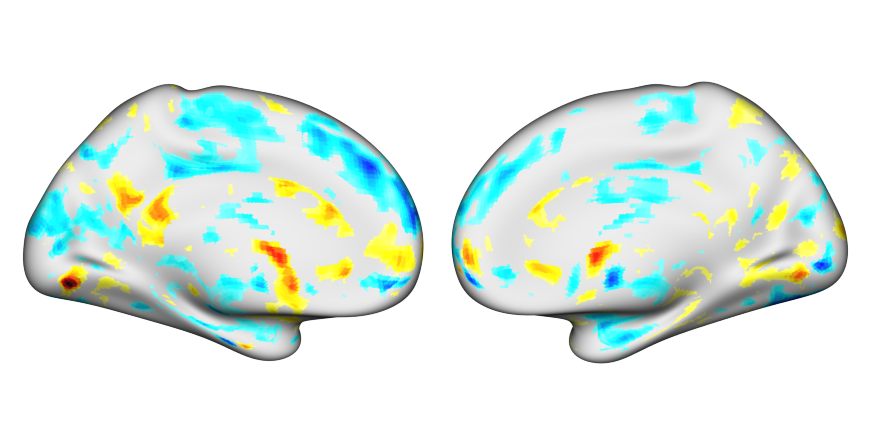

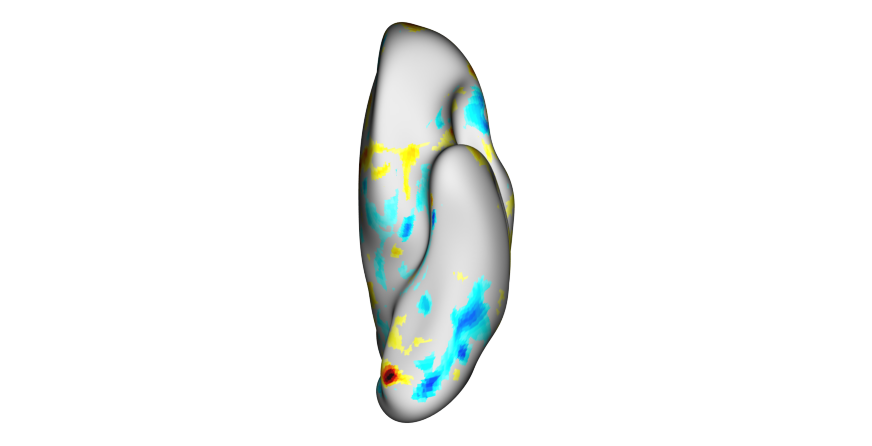

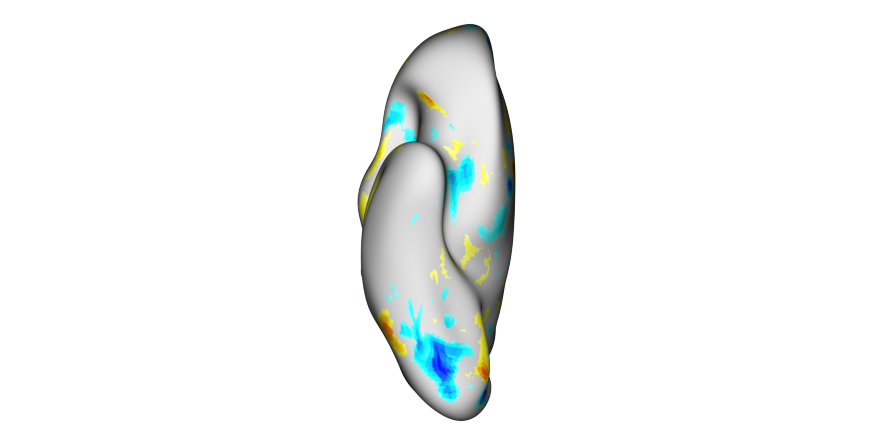

In [15]:
from surfplot import Plot
from surfplot.utils import add_fslr_medial_wall
from neuromaps.datasets import fetch_fslr, fetch_fsaverage
from neuromaps.transforms import mni152_to_fslr, mni152_to_fsaverage

surfaces = fetch_fslr(density='164k')
lh, rh = surfaces['inflated']

enc_lh_thr= "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.L.shape.gii"
enc_rh_thr= "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.R.shape.gii"

vmax = 1#abs(load_img("../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_.nii.gz").get_fdata()).max()
color_range = (-vmax, vmax)
brightness = 0.7
p = Plot(surf_lh=lh, surf_rh=rh, views=['lateral'], size=(1000, 500), zoom=1.2, brightness=brightness)
#fig = p.build()
p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

p = Plot(surf_lh=lh, surf_rh=rh, views=['medial'], size=(1000, 500), zoom=1.2, brightness=brightness)

#fig = p.build()
p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

p = Plot(surf_lh=lh, views=['ventral'], size=(1000, 500), zoom=1.2,layout='row', brightness=brightness)

#fig = p.build()
p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

p = Plot(surf_rh=rh, views=['ventral'], size=(1000, 500), zoom=1.2,layout='row', brightness=brightness)

#fig = p.build()
p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
            cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
fig = p.build()
fig.show()

### Thalamus + brainstem

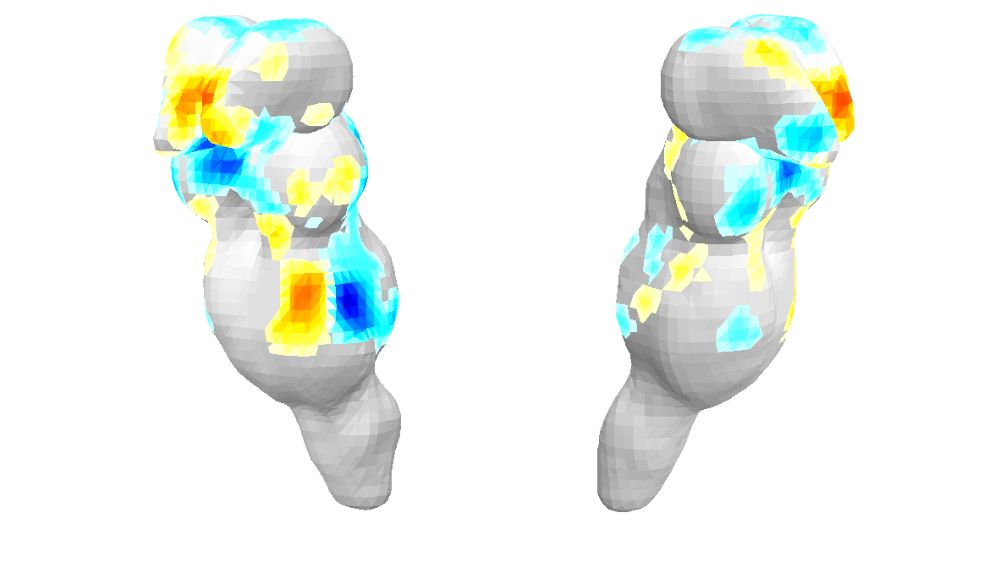

In [16]:
img = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_30.nii.gz"

fig, _ = plot_surf_subcortical(img, cmap=cm.cold_white_hot, vmax=1, vmin=-1)

### Brain cuts

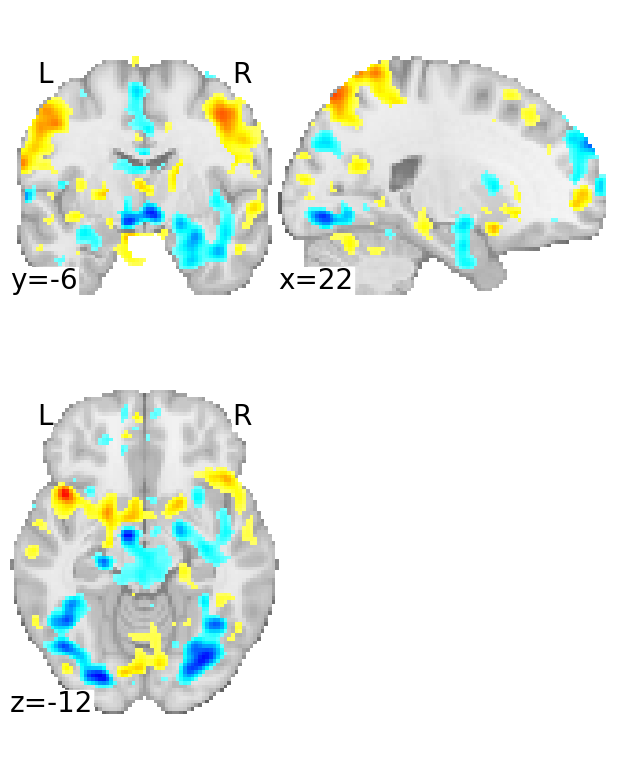

In [17]:
from nilearn.plotting import plot_img, view_img, plot_stat_map
from nilearn.datasets import load_mni152_template
img = "../results/Y-mavg_bulbf_ccaf_M-sbp_auc_g_both_task-both/phenotypes/ridge/ab_encoding_fdr_scaled_z1.nii.gz"
mni152_fmri = resample_to_img(load_mni152_template(), img)

display = plot_stat_map(img, display_mode='tiled', bg_img=mni152_fmri, 
              cmap=cm.cold_white_hot,  black_bg=False, colorbar=False, vmax=1, draw_cross=False,
              threshold=1e-6, cut_coords=(22, -6, -12), 
              dim=0.5)

display.annotate(left_right=True, positions=True, size=20)

# X-to-M path encoding weight maps, unfiltered

In [18]:
for M in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
    # Convert to surface files
    input_file = f"../results/Y-mavg_bulbf_ccaf_M-{M}_task-both/phenotypes/ridge/ab_encoding.nii.gz"
    
    #scale full encoding weight maps
    ab_encoding_img_scaled = unmask(maxabs_scale(apply_mask(input_file, mask_img)), mask_img)
    
    input_file = input_file.replace(".nii.gz", "_scaled.nii.gz")
    
    ab_encoding_img_scaled.to_filename(input_file)
    
    for hemi in ["L", "R"]:
        ref_surface= f"../data/Q1-Q6_R440.{hemi}.pial.164k_fs_LR.surf.gii"
        outfile = input_file.replace(".nii.gz", f".{hemi}.shape.gii")
        cmd = f"wb_command -volume-to-surface-mapping {input_file} {ref_surface} {outfile} -enclosing"
        os.system(cmd)

sbp_reactivity_both


/tmp/ipykernel_21865/1241814524.py:26: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


sbp_auc_g_both
sbp_auc_i_both


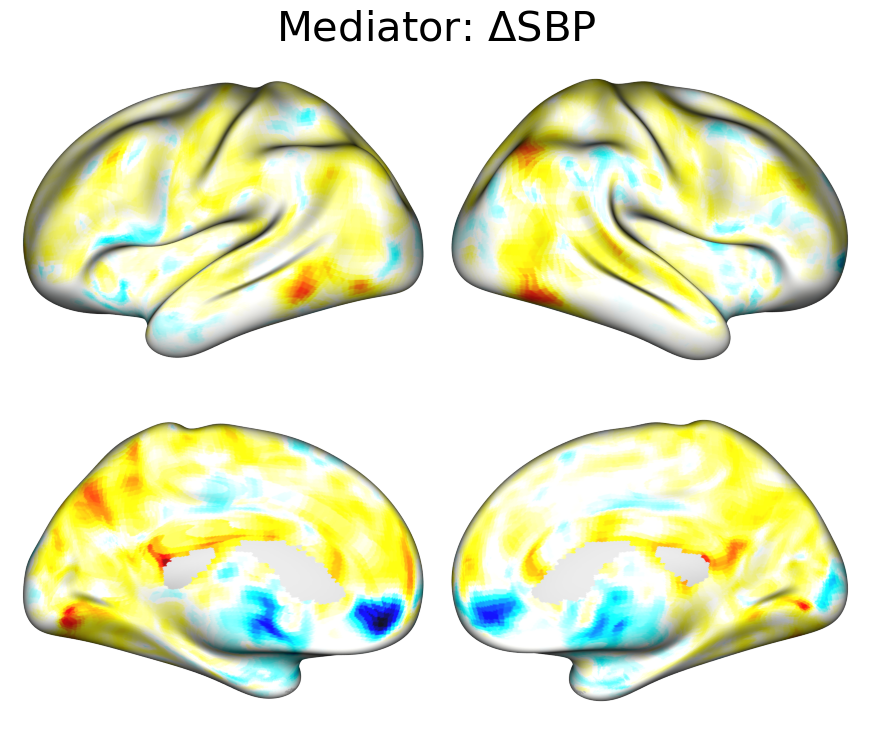

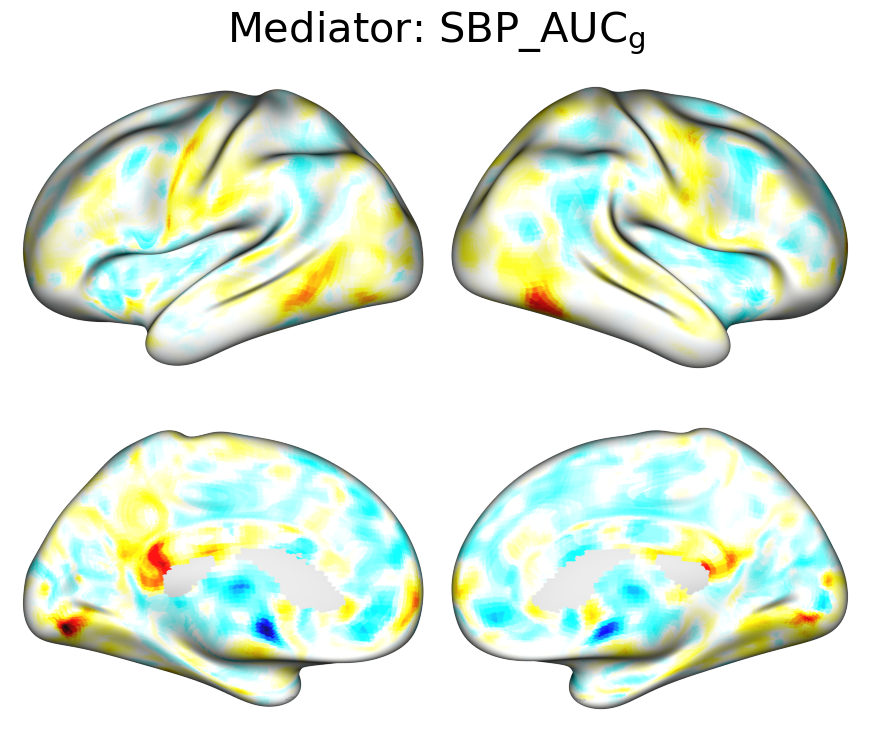

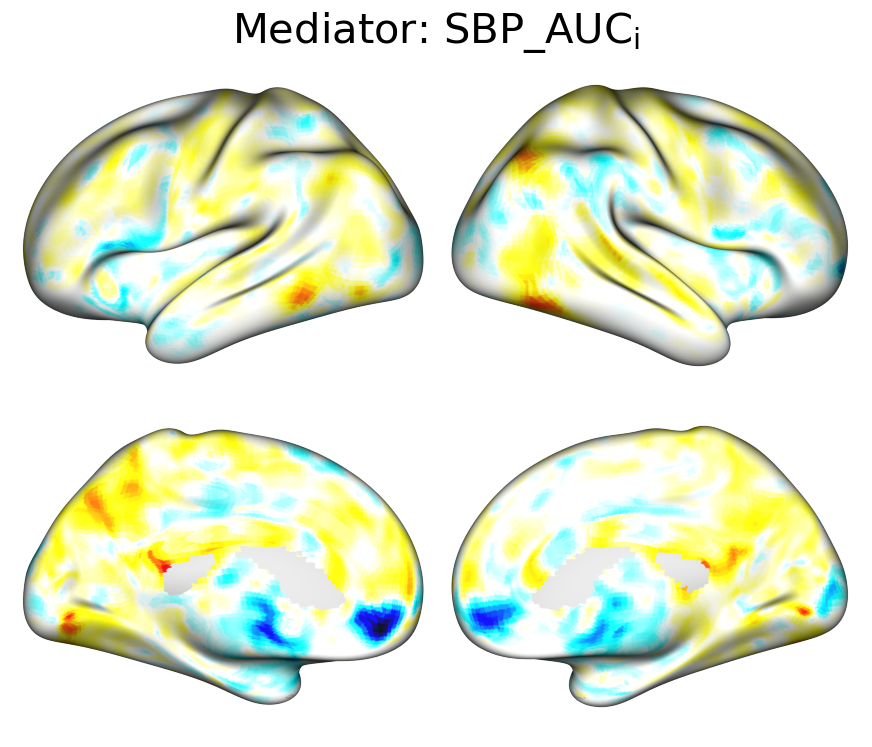

In [19]:
from surfplot import Plot
from surfplot.utils import add_fslr_medial_wall
from neuromaps.datasets import fetch_fslr, fetch_fsaverage
from neuromaps.transforms import mni152_to_fslr, mni152_to_fsaverage
import nibabel as nib

surfaces = fetch_fslr(density='164k')
lh, rh = surfaces['inflated']

for name_M, M in zip([r'$\Delta$' + 'SBP', 'SBP_' + r'${\rm AUC}_{\rm g}$', 'SBP_' + r'${\rm AUC}_{\rm i}$'],
                     ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]):
    print(M)
    enc_lh_thr= f"../results/Y-mavg_bulbf_ccaf_M-{M}_task-both/phenotypes/ridge/ab_encoding_scaled.L.shape.gii"
    enc_rh_thr= f"../results/Y-mavg_bulbf_ccaf_M-{M}_task-both/phenotypes/ridge/ab_encoding_scaled.R.shape.gii"

    vmax = np.max([np.max(abs(nib.load(enc_lh_thr).agg_data())), np.max(abs(nib.load(enc_rh_thr).agg_data()))])
    color_range = (-vmax, vmax)

    brightness = 0.7
    p = Plot(surf_lh=lh, surf_rh=rh, size=(1000, 800), brightness=brightness)
    #fig = p.build()
    p.add_layer({'left': enc_lh_thr, 'right': enc_rh_thr}, 
                cmap=cm.cold_white_hot, cbar=False, color_range=color_range)
    fig = p.build()
    fig.axes[0].set_title(f"Mediator: {name_M}", size=30)
    fig.show()

Compute correlations between maps...

In [20]:
list_weights_dict = dict()
for M in ["sbp_reactivity_both", "sbp_auc_g_both", "sbp_auc_i_both"]:
    # Convert to surface files
    input_file = f"../results/Y-mavg_bulbf_ccaf_M-{M}_task-both/phenotypes/ridge/ab_encoding_scaled.nii.gz"
    #print(load_img(input_file).get_fdata().max())
    #print(load_img(input_file).get_fdata().min())
    list_weights_dict[M] = apply_mask(input_file, mask_img)
    
pd.DataFrame(list_weights_dict).corr(method='pearson').round(2)

,sbp_reactivity_both,sbp_auc_g_both,sbp_auc_i_both
sbp_reactivity_both,1.00,0.42,0.96
sbp_auc_g_both,0.42,1.00,0.43
sbp_auc_i_both,0.96,0.43,1.00
